# Final Project Report

#### STATS 102 Introduction to Data Science Session 1, 2022 Fall

---

# Using selected features to predict a football player's positions

-Yuchen Song (ys396@duke.edu)

-Boyan Zhang (bz106@duke.edu)

-Yizhi Wang (yw571@duke.edu)

-Baoguanyan Kang (bk220@duke.edu)


## 1 Introduction

Our program will 

  1.Give the analysis of the features of a football player 

  2.Use two Binary Classification method to predict the positions

  3.Evaluate the result, give analysis, and make improvement 


## 2 Background 

FIFA is a football game developed by an EA game company, meaning there is a large amount of investment in it and a lot of technology in it. 

Additionally, football is the first sport in the world，it is a really big IP attracting fans. What’s more, compared with other football games, FIFA has the most copyrights and seems authoritative in the football game market.

## 3 Design and Implementation


### 3.1 Data Sculpling



#### 3.1 (a) Choosing the framework for data sculpting

The library we ended up using for data sculpting is "Beautiful Soup 4" for its ease of use and flexibility. Combined with requests and pandas, that formed the core function of the Data Sculpter. In order to optimise for performance, we introduced the ThreadPoolExecutor to governence the execution of the main function. To further visualize the process, we introduced the tqdm package to manage the time of execution.


In [ ]:
from bs4 import BeautifulSoup
import requests
import pandas as pd
import re
from tqdm import tqdm
import time
from concurrent.futures.thread import ThreadPoolExecutor
import sys

#### 3.1 (b) Supporting functions
The supporting functions are listed here in alphabatical order.
The "drawProgressBar" function is a simple implementation to handle the rough progress and eta in multi-thread workload.
The "gen_url" and "gen_url_helper" function works together, thay takes a base url and verson and returns a pandas DataFrame that contains all the URLs and related data for the core function to work on. This part is single-threaded.
The "get_date" and "get_latest_rev" function are supporting functions for the "gen_url" function, they get date and revision information on sofifa.com and returns the revision and date info respectively.

In [ ]:
def drawProgressBar(len,cur,start, barLen = 20):
    sys.stdout.write("\r")
    elap=time.perf_counter()-start
    eta=elap*((len/cur)-1)
    percent=cur/len
    sys.stdout.write("[{:<{}}] {:.0f}% {}".format("=" * int(barLen * percent), barLen, percent * 100,f"Elapsed:{elap}s Eta:{eta}s"))
    sys.stdout.flush()
def gen_url(version,base,offset,versions):
    urllst=[]
    datelst=[]
    revs=[]
    datedic=get_date(f"{base}&r={version}0001&set=True")
    for i in range(offset+1):
        rtn=gen_url_helper(version,base,i,versions,datedic)
        urllst.extend(rtn[0])
        datelst.extend(rtn[1])
        revs.extend(rtn[2])
    urldf=pd.DataFrame(data=[urllst,datelst,revs], index=["url","date","version",])
    return urldf
def gen_url_helper(version,base,offset,versions,datedic):
    revs=[f"{version}{str(i+1).zfill(4)}" for i in range(versions.get(version))]
    urllst=[f"{base}&r={rev}&offset={str(offset * 60)}&set=True" for rev in revs]
    datelst=[datedic.get(rev) for rev in revs]
    return (urllst,datelst[::-1],revs)
def get_date(url):
    soup = BeautifulSoup(requests.get(url).content, "html.parser")
    return {re.findall('r=(\d+)',i.get("href"))[0]:i.get_text(strip=True) for i in soup.select("body > header > .header > div > h2 > div > div ")[1].select("a")}
def get_latest_rev(url):
    soup = BeautifulSoup(requests.get(url).content, "html.parser")
    versionlst=soup.select("body > header > .header > div > h2 > div > div ")[0].select("a")
    url=versionlst[0].get("href")
    re.findall('r=(\d+)',url)[0]
    verrev=[re.findall('r=(\d+)',url.get("href"))[0] for url in versionlst]
    tmplst=[[line[0:2],int(line[2:])] for line in verrev]
    return {tmplst[i][0]:tmplst[i][1] for i in range(len(tmplst))}

#### 3.1 (c) Core function
The core function scultps all the useful data from the website and add all the data to a list as a list. Which will later be converted into a pandas DataFrame for further usage.

In [ ]:
def get_data(url,version,date,all_data,len,cur,start) :
    soup = BeautifulSoup(requests.get(url,timeout=1000,allow_redirects=True).content, "html.parser")
    drawProgressBar(len,cur,start)
    for row in soup.select ( "tbody tr") :
        id_ = row.select_one ("img[id]") ["id"]
        name = row.select_one(".col-name [aria-label]") ["aria-label"]
        age = row.select_one (".col-ae").get_text (strip=True)
        positions = [p.get_text (strip=True) for p in row.select ("span.pos") ]
        nationality = row.select_one ("img.flag") ["title" ]
        foot=row.select_one(".col-pf").get_text(strip=True)
        overall = row. select_one(".col-oa"). get_text (strip=True)
        potential = row.select_one(".col-pt") .get_text(strip=True)
        attacking = row.select_one(".col-ta") .get_text(strip=True)
        skill = row.select_one(".col-ts") .get_text(strip=True)
        movement = row.select_one(".col-to") .get_text(strip=True)
        power = row.select_one(".col-tp") .get_text(strip=True)
        mentality = row.select_one(".col-te") .get_text(strip=True)
        defending = row.select_one(".col-td") .get_text(strip=True)
        goalkeeping = row.select_one(".col-tg") .get_text(strip=True)
        height = row.select_one(".col-hi").get_text(strip=True)
        weight = row.select_one(".col-wi").get_text(strip=True)
        best_overall = row.select_one(".col-bo").get_text(strip=True)
        best_position = row.select_one(".col-bp").get_text(strip=True)
        growth = row.select_one(".col-gu").get_text(strip=True)
        crossing = row.select_one(".col-cr").get_text(strip=True)
        finishing = row.select_one(".col-fi").get_text(strip=True)
        heading_accu = row.select_one(".col-he").get_text(strip=True)
        short_passing = row.select_one(".col-sh").get_text(strip=True)
        volleys = row.select_one(".col-vo").get_text(strip=True)
        ball_cont = row.select_one(".col-bl").get_text(strip=True)
        acceleration = row.select_one(".col-ac").get_text(strip=True)
        sprint_speed = row.select_one(".col-sp").get_text(strip=True)
        agility = row.select_one(".col-ag").get_text(strip=True)
        reactions = row.select_one(".col-re").get_text(strip=True)
        balance = row.select_one(".col-ba").get_text(strip=True)
        shot_power = row.select_one(".col-so").get_text(strip=True)
        jumping = row.select_one(".col-ju").get_text(strip=True)
        stamina = row.select_one(".col-st").get_text(strip=True)
        strength = row.select_one(".col-st").get_text(strip=True)
        long_shots = row.select_one(".col-ln").get_text(strip=True)
        aggression = row.select_one(".col-ar").get_text(strip=True)
        interceptions = row.select_one(".col-in").get_text(strip=True)
        positioning = row.select_one(".col-po").get_text(strip=True)
        vision = row.select_one(".col-vi").get_text(strip=True)
        penalties = row.select_one(".col-pe").get_text(strip=True)
        composure = row.select_one(".col-cm").get_text(strip=True)
        marking = row.select_one(".col-ma").get_text(strip=True)
        standing_tackle = row.select_one(".col-sa").get_text(strip=True)
        gk_diving = row.select_one(".col-gd").get_text(strip=True)
        gk_handling = row.select_one(".col-gh").get_text(strip=True)
        gk_kicking = row.select_one(".col-gc").get_text(strip=True)
        gk_positioning = row.select_one(".col-gp").get_text(strip=True)
        gk_reflexes = row.select_one(".col-gr").get_text(strip=True)
        pace_diving = row.select_one(".col-pac").get_text(strip=True)
        shooting_handling = row.select_one(".col-sho").get_text(strip=True)
        passing_kicking = row.select_one(".col-pas").get_text(strip=True)
        dribbling_reflexed = row.select_one(".col-dri").get_text(strip=True)
        defenging_pace = row.select_one(".col-def").get_text(strip=True)
        physical_positioning = row.select_one(".col-phy").get_text(strip=True)
        club = row.select_one (".col-name > div > a"). get_text (strip=True)
        if club == "":
            club = row.select_one(".col-name > div > a" )["title" ]
        value= row.select_one( ".col-vl").get_text (strip=True)
        wage = row.select_one(".col-wg").get_text(strip=True)
        all_data.append(
            [
                id_,name,version,date,age,", ".join(positions),nationality,overall,potential,attacking,skill,movement,power,mentality,defending,goalkeeping,club,value,wage,height,weight,best_overall,best_position,growth,crossing,finishing,heading_accu,short_passing,volleys,ball_cont,acceleration,sprint_speed,agility,reactions,balance,shot_power,jumping,stamina,strength,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes,pace_diving,shooting_handling,passing_kicking,dribbling_reflexed,defenging_pace,physical_positioning
            ]
        )
    return

#### 3.1 (d) Multi-tread optimization and entrypoint of the program
The function "runner" generates the static arguments for the core function. While the TreadPoolExecutor will govern all the workers' job. After all the jobs are done, the program will automatically continue and generate a csv file named "data_se2.csv" This is programmed intentionally as doing a data sculpting every run has a very low effiency, so it is better to load the sculpted dataset from local storage 

In [ ]:
def runner(version,base,off,args,latest):
    versions = get_latest_rev(base)
    urls_df=gen_url(version,base,off,versions)
    if latest:
        urls_df=urls_df.T.sort_values(by="version",ascending=False).iloc[:off].T
    for i in range(urls_df.shape[1]):
        urls=list(urls_df.loc["url"])
        revisions=list(urls_df.loc["version"])
        dates=list(urls_df.loc["date"])
        args.append([urls[i],revisions[i],dates[i]])

VERSION_START=12
VERSION_END=24
GLOBAL_OFFSET=120
ONLY_INCLUDE_FINAL_REVISION=True
TOTAL_WORKER=32

all_data=[]
args=[]
url="https://sofifa.com/?showCol%5B%5D=ae&showCol%5B%5D=hi&showCol%5B%5D=wi&showCol%5B%5D=pf&showCol%5B%5D=oa&showCol%5B%5D=pt&showCol%5B%5D=bo&showCol%5B%5D=bp&showCol%5B%5D=gu&showCol%5B%5D=jt&showCol%5B%5D=le&showCol%5B%5D=vl&showCol%5B%5D=wg&showCol%5B%5D=rc&showCol%5B%5D=ta&showCol%5B%5D=cr&showCol%5B%5D=fi&showCol%5B%5D=he&showCol%5B%5D=sh&showCol%5B%5D=vo&showCol%5B%5D=ts&showCol%5B%5D=dr&showCol%5B%5D=cu&showCol%5B%5D=fr&showCol%5B%5D=lo&showCol%5B%5D=bl&showCol%5B%5D=to&showCol%5B%5D=ac&showCol%5B%5D=sp&showCol%5B%5D=ag&showCol%5B%5D=re&showCol%5B%5D=ba&showCol%5B%5D=tp&showCol%5B%5D=so&showCol%5B%5D=ju&showCol%5B%5D=st&showCol%5B%5D=sr&showCol%5B%5D=ln&showCol%5B%5D=te&showCol%5B%5D=ar&showCol%5B%5D=in&showCol%5B%5D=po&showCol%5B%5D=vi&showCol%5B%5D=pe&showCol%5B%5D=cm&showCol%5B%5D=td&showCol%5B%5D=ma&showCol%5B%5D=sa&showCol%5B%5D=sl&showCol%5B%5D=tg&showCol%5B%5D=gd&showCol%5B%5D=gh&showCol%5B%5D=gc&showCol%5B%5D=gp&showCol%5B%5D=gr&showCol%5B%5D=tt&showCol%5B%5D=bs&showCol%5B%5D=wk&showCol%5B%5D=sk&showCol%5B%5D=aw&showCol%5B%5D=dw&showCol%5B%5D=ir&showCol%5B%5D=bt&showCol%5B%5D=pac&showCol%5B%5D=sho&showCol%5B%5D=pas&showCol%5B%5D=dri&showCol%5B%5D=def&showCol%5B%5D=phy"
for ver in tqdm(range(VERSION_START,VERSION_END),desc="Preparing"):
        runner(str(ver).zfill(2),url,GLOBAL_OFFSET,args,ONLY_INCLUDE_FINAL_REVISION)
with ThreadPoolExecutor(max_workers=TOTAL_WORKER) as executor:
    start=time.perf_counter()
    i=0
    for arg in args:
        executor.submit(get_data, arg[0], arg[1], arg[2],all_data,len(args),i ,start)
        i+=1
print("\nMaking DataFrame\n")
df = pd.DataFrame(
    all_data,
    columns=[
        "ID","Name","Version","Date","Age","Positions","Nationality","Foot","Overall","Potential","attacking","skill","movement","power","mentality","defending","goalkeeping","Club","Value","Wage",'height','weight','best-overall','best-position','growth','crossing','finishing','heading-accu','short-passing','volleys','ball-cont','acceleration','sprint-speed','agility','reactions','balance','shot-power','jumping','stamina','strength','long-shots','aggression','interceptions','positioning','vision','penalties','composure','marking','standing-tackle','gk-diving','gk-handling','gk-kicking','gk-positioning','gk-reflexes','pace-diving','shooting-handling','passing-kicking','dribbling-reflexed','defenging-pace','physical-positioning'
    ]
)
print("Saving\n")
df.to_csv("data_se2.csv",index=False)
print("All Done!")

### 3.2 Data Manipulation

In [3]:
import re
import pandas as pd
import numpy as np
from numpy import NaN
dt=pd.read_csv("data_se2.csv")
dt.columns = dt.columns.map(lambda x:x.capitalize())

#### a. Data Structure

This is our dataframe. It consists __79140__ FIFA football players from all versions in the game FIFA, with their __61 feartures__ ranging from Id, Name, Positions, to different abilities scores.

##### Brief introducrion to the features:

###### i).  Three categories of feature.

1.  Some basic information about the players, 
such as Age, Positions a player is qualified for , Club a player belongs to , and Nationality.

2.  Six main abilities: 
    
    Attacking, to evaluate the players who have a strong ability to get the goal or the assistant.

    Skill, which is about the passing, shooting and dribbling, it is very important for the player to have the basic skills. 

    Movement, including pace, endurance and physical. 

    Power means the players have enough energetic know how to play and control the game, and are thirsty for the ball. 

    Mentality means players need to have a strong spirit power to win the competition and won’t be nervous when they face the difficulties. 
    
    Defending, which shows the players who look for tackling the ball. Last, the seventh ability.

    Goalkeeping is used for evaluating the goalkeeper.( Not included in the six main abilities. )
    
3. Some other abilities to consider their overall grades, such as Finishing, Aggression. However, these different kinds of ability’s grades play different role in different positions. For example, Aggression mostly plays a role in the guard and it will be one of the most important majorities to evaluate the guard, but the Finishing is the extra point.


###### ii.) The relationship between abilities and positions.

First of all, we get that the basic grades of the individual capabilities won’t be changed by playing in different positions. Then, the overall grade changes by playing different positions because that though as we mentioned before, some positions ask for the similar abilities, they still have the differences. For example, CB and RB are both having a request for defending, but one different thing is that RB’s request for pace is a little bit stricter than CB. As a result, although the players may can be a guest performer in other positions, the overall grades will also be influenced and reduced.

In [158]:
dt.shape

(79140, 61)

In [159]:
dt.head(2)

,Id,Name,Version,Date,Age,Positions,Nationality,Foot,Star,Overall,...,Gk-handling,Gk-kicking,Gk-positioning,Gk-reflexes,Pace-diving,Shooting-handling,Passing-kicking,Dribbling-reflexed,Defenging-pace,Physical-positioning
0,155757,Martin Ørnskov Nielsen,120002,"Aug 30, 2011",25,"CM, CB, CDM, CDM",Denmark,Right,3,69,...,6,15,14,15,58,60,68,66,64,75
1,179565,Mario Gavranovic,120002,"Aug 30, 2011",21,"ST, CF, CAM",Switzerland,Right,3,69,...,11,6,13,12,83,67,58,75,38,65


In [160]:
# Some of their features are categorical, 
# like Positions, Nationality, Club, and Foot.

dt[['Positions','Nationality','Club','Foot']].head()

,Positions,Nationality,Club,Foot
0,"CM, CB, CDM, CDM",Denmark,Silkeborg IF,Right
1,"ST, CF, CAM",Switzerland,1. FSV Mainz 05,Right
2,"LM, CAM, LW",Austria,SK Rapid Wien,Left
3,"CDM, CM, RM, LM, CDM",Argentina,Real Zaragoza,Right
4,"LM, LW, CAM, CAM",France,En Avant de Guingamp,Left


In [161]:
# But most of their abilities are measured as intergers on the FIFA website.

dt[['Overall', 'Potential', 'Attacking', 'Skill',
       'Movement', 'Power', 'Mentality', 'Defending', 'Goalkeeping']].head()

,Overall,Potential,Attacking,Skill,Movement,Power,Mentality,Defending,Goalkeeping
0,69,72,320,288,321,352,334,188,62
1,69,77,302,277,385,346,295,96,55
2,69,75,315,328,377,309,289,36,50
3,69,78,295,333,330,340,331,202,47
4,68,68,313,337,380,284,291,102,51


#### b. String Manipulation

Some of their features (Height, Weight, Value, Wage) are measured as integers but with certain units, so I just transferd them from strings into ints.

In [162]:
dt[['Height', 'Weight','Value', 'Wage']].head()

,Height,Weight,Value,Wage
0,184cm,75kg,€900K,€5K
1,175cm,74kg,€1.8M,€7K
2,184cm,78kg,€1.5M,€9K
3,176cm,74kg,€1.7M,€10K
4,172cm,65kg,€550K,€4K


In [ ]:
# Height_cm
kk=re.compile('\d+')
for i in range(dt.shape[0]):
    dt['Height'][i]=int(kk.findall(dt['Height'][i])[0])
dt['Height_cm']=dt['Height']
dt=dt.drop('Height',axis=1)

In [ ]:
#Weight_kg
kk=re.compile('\d+')
for i in range(dt.shape[0]):
    dt['Weight'][i]=int(kk.findall(dt['Weight'][i])[0])
dt['Weight_kg']=dt['Weight']
dt=dt.drop('Weight',axis=1)

In [ ]:
#Value_euro
kk=re.compile('\d+')
for i in range(dt.shape[0]):
    num=int(re.findall('[0-9]+',dt['Value'][i])[0])
    if("M" in dt['Value'][i]):
        num*=1000000
    if("K" in dt['Value'][i]):
        num*=1000
    dt['Value'][i]=num
dt['Value_euro']=dt['Value']
dt=dt.drop('Value',axis=1)

In [ ]:
#Wage_euro
kk=re.compile('\d+')
for i in range(dt.shape[0]):
    num=int(re.findall('[0-9]+',dt['Wage'][i])[0])
    if("M" in dt['Wage'][i]):
        num*=1000000
    if("K" in dt['Wage'][i]):
        num*=1000
    dt['Wage'][i]=num
dt['Wage_euro']=dt['Wage']
dt=dt.drop('Wage',axis=1)

#### c. One-hot encoding for positions

In [ ]:
dfps=dt
dfps.Positions=dt.Positions.str.split(', ')
dfps.Positions
position=[]
for i in range(dt.shape[0]):
    position.extend(dfps['Positions'][i])
position=np.unique(position)
for i in position:
    dfps[i]=0
for i in position:
    for j in range(dt.shape[0]):
        dfps[i][j]=(i in dfps['Positions'][j])
    dfps.loc[dfps[i]==True,i]=1
    dfps.loc[dfps[i]==False,i]=0
DT=dt # make a copy

In [188]:
dt[['Positions','CAM', 'CB', 'CDM', 'CF', 'CM', 'GK', 'LB', 'LM', 'LW',
       'LWB', 'N/A', 'RB', 'RM', 'RW', 'RWB', 'ST']].head()

,Positions,CAM,CB,CDM,CF,CM,GK,LB,LM,LW,LWB,N/A,RB,RM,RW,RWB,ST
0,"[CM, CB, CDM, CDM]",0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0
1,"[ST, CF, CAM]",1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
2,"[LM, CAM, LW]",1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0
3,"[CDM, CM, RM, LM, CDM]",0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0
4,"[LM, LW, CAM, CAM]",1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0


### 3.3 Data Cleaning

We noticed the __'N/A'__ in the positins, which is due to some problem with the original website page, so we simply delete them in the position columns.

In [236]:
position=['CAM', 'CB', 'CDM', 'CF', 'CM', 'GK', 'LB', 'LM', 'LW',
       'LWB', 'RB', 'RM', 'RW', 'RWB', 'ST']

In [225]:
for i in range(dt.shape[0]):
    if('N/A' in dt['Positions'][i]):
        dt['Positions'][i].remove('N/A')

In [ ]:
dt.describe()

,Id,Version,Age,Star,Overall,Potential,Attacking,Skill,Movement,Power,...,Gk-handling,Gk-kicking,Gk-positioning,Gk-reflexes,Pace-diving,Shooting-handling,Passing-kicking,Dribbling-reflexed,Defenging-pace,Physical-positioning
count,79140.000000,79140.000000,79140.000000,79140.000000,79140.000000,79140.000000,79140.000000,79140.000000,79140.000000,79140.000000,...,79140.000000,79140.000000,79140.000000,79140.000000,79140.000000,79140.000000,79140.000000,79140.000000,79140.000000,79140.000000
mean,190837.967349,170097.678544,26.350177,3.074577,71.794049,74.535380,279.719623,289.458643,336.028645,323.873414,...,16.006823,15.823730,16.125676,16.405257,70.423515,59.594655,63.727761,68.084256,54.392166,69.395957
std,43226.871319,31620.448223,4.158154,0.689265,4.378234,5.130444,72.526691,77.607747,52.539267,47.205776,...,17.731623,17.118596,18.122160,19.068695,11.175036,13.293952,8.916209,9.466355,17.428073,8.165095
min,2.000000,120002.000000,15.000000,1.000000,64.000000,64.000000,40.000000,43.000000,131.000000,112.000000,...,1.000000,1.000000,1.000000,1.000000,21.000000,14.000000,25.000000,27.000000,15.000000,32.000000
25%,177564.000000,140052.000000,23.000000,3.000000,69.000000,71.000000,259.000000,261.000000,306.000000,304.000000,...,8.000000,8.000000,8.000000,8.000000,65.000000,51.000000,59.000000,64.000000,38.000000,65.000000
50%,198863.000000,170099.000000,26.000000,3.000000,71.000000,74.000000,298.000000,308.000000,345.000000,333.000000,...,11.000000,11.000000,11.000000,11.000000,72.000000,63.000000,65.000000,70.000000,60.000000,70.000000
75%,215927.000000,200061.000000,29.000000,3.000000,74.000000,78.000000,325.000000,341.000000,374.000000,355.000000,...,14.000000,14.000000,14.000000,14.000000,78.000000,69.000000,70.000000,74.000000,69.000000,75.000000
max,268297.000000,220069.000000,45.000000,5.000000,94.000000,97.000000,438.000000,472.000000,471.000000,453.000000,...,92.000000,95.000000,91.000000,93.000000,97.000000,93.000000,95.000000,97.000000,91.000000,92.000000


### 3.4 Data Analysis & Visualization

To have a rough look at the data. We focused mainly on the distributions of the features, beacuse the 'two peak' distribution is quite unusual, which draws our attention to the abilities. We can also conclude from the pairplot that the features are not very independent, and they have some large correlations.

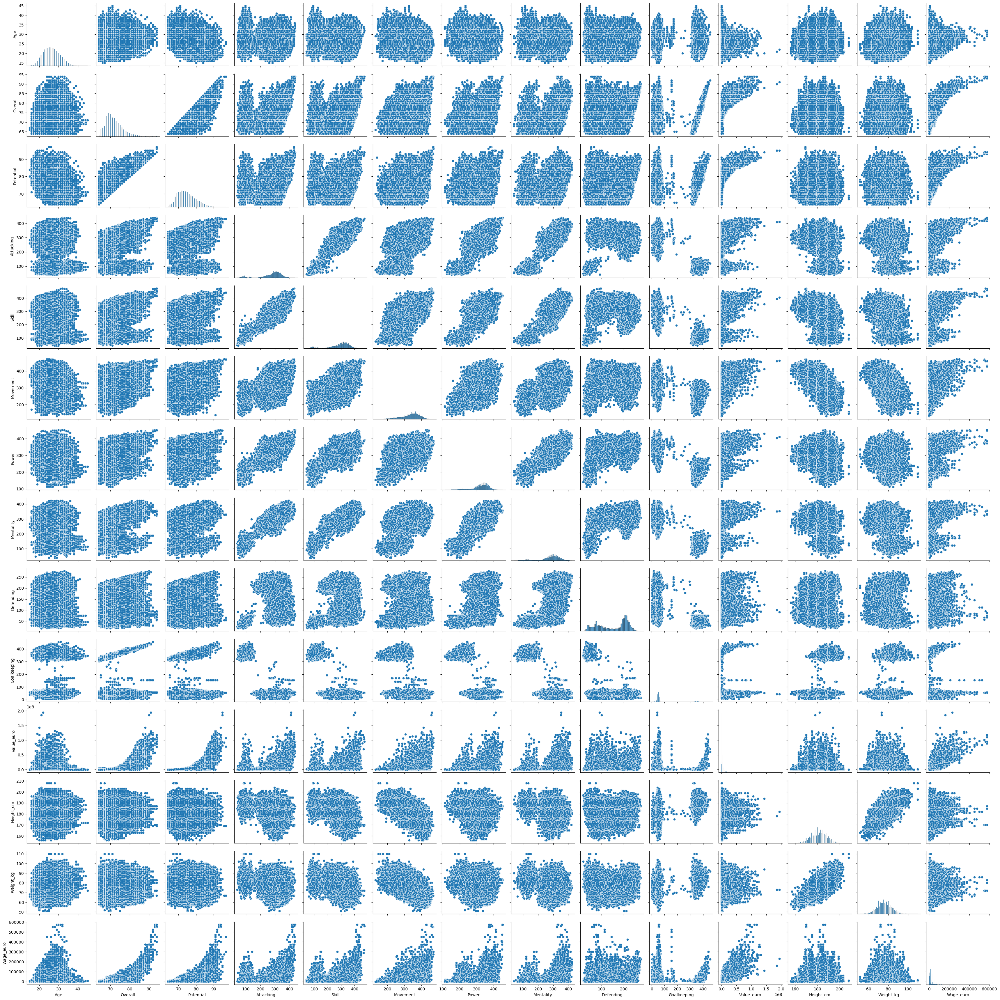

In [ ]:
import seaborn as sns
sns.pairplot(data=simple_dt)

In [46]:
import plotly
import seaborn as sns
import plotly_express as px
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots

#### a. We firstly see the distribution and relationship between Age and Overall, which are the two highly conclusive features for a football player.

In [ ]:
fig = px.density_heatmap(dt, y="Age", x="Overall", marginal_x="histogram", marginal_y="histogram")
fig.show()

#### b. Secondly we see the distribution of the six main abilities.  
The outcome is unusual. We initiallt expected to see Gaussian distribution, but what we get have two peak, and seemed two Gaussian distribution overlapping.

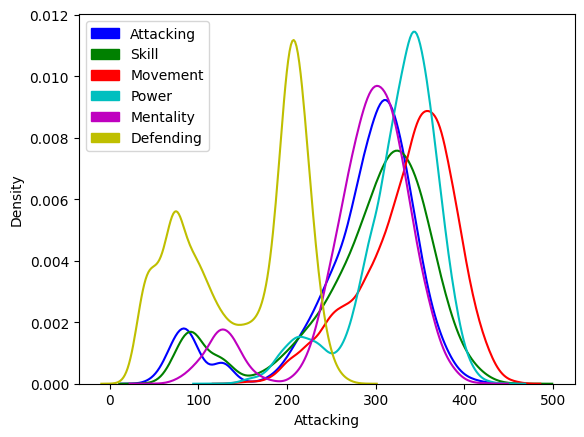

In [47]:
import matplotlib.patches as mpatches
fig_fea=['Attacking', 'Skill','Movement', 'Power', 'Mentality', 'Defending']
label_patches = []
colors={
    'Attacking':"b",
    'Skill':"g",
    'Movement':"r",
    'Power':"c",
    'Mentality':"m",
    'Defending':"y",
}
for fea in fig_fea:
    fig = sns.kdeplot(dt[fea],color=colors.get(fea))
    label_patch = mpatches.Patch(label=fea,color=colors.get(fea))
    label_patches.append(label_patch)
fig.legend(handles=label_patches, loc='upper left')

#### c. See how the relationship between six main abilities for all the players and the top ten players of each position_category. 

In [267]:
from pandas import DataFrame
from sklearn.preprocessing import Normalizer
fea2=['Attacking', 'Skill', 'Movement', 'Power', 'Mentality', 'Defending','Goalkeeping']
dt_ab=dt[fea2]
dt_ab = Normalizer(norm='l2').fit_transform(dt_ab)
dt_ab =DataFrame(dt_ab ,columns=fea2)
dt_ab[['Overall','Positions']]=dt[['Overall','Positions']]
dt_ab.head()

,Attacking,Skill,Movement,Power,Mentality,Defending,Goalkeeping,Overall,Positions
0,0.426465,0.383818,0.427797,0.469111,0.445122,0.250548,0.082628,69,"[CM, CB, CDM, CDM]"
1,0.412832,0.378657,0.526292,0.472980,0.403263,0.131231,0.075185,69,"[ST, CF, CAM]"
2,0.431979,0.449807,0.517003,0.423751,0.396323,0.049369,0.068568,69,"[LM, CAM, LW]"
3,0.389039,0.439152,0.435196,0.448383,0.436514,0.266392,0.061982,69,"[CDM, CM, RM, LM, CDM]"
4,0.428213,0.461047,0.519875,0.388538,0.398115,0.139545,0.069773,68,"[LM, LW, CAM, CAM]"


In [ ]:
# Categories of different positions
# 1 锋线 CF, RW, LW , ST
# 2 中场：CM, CDM, CAM, RW, LW, RM, LM
# 3 后防线：RB, CB, LB, LWB, RWB
# 4 门将 GK

In [268]:
# 1 锋线 CF, RW, LW , ST

front=['CF','RW','LW','ST']
index=[]
for i in range(dt_ab.shape[0]):
    for j in front:
        if(j in dt_ab['Positions'][i]):
            index.append(i)
dt_front=dt_ab.iloc[index]

In [269]:
# 2 中场：CM, CDM, CAM, RW, LW, RM, LM

middle=['CM', 'CDM', 'CAM', 'RW', 'LW', 'RM', 'LM', ]
index=[]
for i in range(dt_ab.shape[0]):
    for j in middle:
        if(j in dt_ab['Positions'][i]):
            index.append(i)
dt_middle=dt_ab.iloc[index]

In [270]:
# 3 后防线：RB, CB, LB, LWB, RWB

back=['RB', 'CB', 'LB', 'LWB', 'RWB']
index=[]
for i in range(dt_ab.shape[0]):
    for j in back:
        if(j in dt_ab['Positions'][i]):
            index.append(i)
dt_back=dt_ab.iloc[index]

In [271]:
# 4 门将 GK

index=[]
for i in range(dt_ab.shape[0]):
    if('GK' in dt_ab['Positions'][i]):
        index.append(i)
dt_gk=dt_ab.iloc[index]

,Attacking,Skill,Movement,Power,Mentality,Defending,Goalkeeping,Overall,Positions
17,0.109386,0.189321,0.473304,0.439646,0.216668,0.077832,0.694179,67,"[GK, GK]"
23,0.163684,0.201312,0.539968,0.425201,0.197549,0.069613,0.645328,69,"[GK, GK]"
36,0.229225,0.234908,0.443294,0.414878,0.270902,0.125032,0.659258,70,"[GK, GK]"
37,0.127876,0.116251,0.499880,0.391379,0.275128,0.069751,0.697507,71,"[GK, GK]"
38,0.118042,0.149004,0.499261,0.435402,0.205123,0.075470,0.690838,71,"[GK, GK]"
...,...,...,...,...,...,...,...,...,...
79101,0.146443,0.233928,0.464052,0.393683,0.188283,0.081780,0.715096,75,"[GK, GK]"
79115,0.161854,0.189759,0.433470,0.446493,0.264175,0.109763,0.684622,75,"[GK, GK]"
79116,0.174707,0.156121,0.516686,0.418181,0.210020,0.094788,0.670948,75,"[GK, GK]"
79119,0.163763,0.171751,0.393430,0.361476,0.281592,0.109841,0.752909,75,"[GK, GK]"


In [276]:
import plotly.graph_objects as go
labels=np.array(['Attacking', 'Skill', 'Movement', 'Power', 'Mentality', 'Defending'])
fm='Front_Mean'
mm='Middle_Mean'
bm='Back_Mean'
gkm='Gk_Mean'
ft='Front_Top_Ten'
mt='Middle_Top_Ten'
bt='Back_Top_Ten'
gkt='Gk_Top_Ten'

fm_data = dt_front.mean(numeric_only=True).values[:6]
mm_data = dt_middle.mean(numeric_only=True).values[:6]
bm_data = dt_back.mean(numeric_only=True).values[:6]
gkm_data = dt_gk.mean(numeric_only=True).values[:6]
ft_data = dt_front.sort_values(by="Overall")[-1:-11:-1].mean(numeric_only=True).values[:6]
mt_data = dt_middle.sort_values(by="Overall")[-1:-11:-1].mean(numeric_only=True).values[:6]
bt_data = dt_back.sort_values(by="Overall")[-1:-11:-1].mean(numeric_only=True).values[:6]
gkt_data = dt_gk.sort_values(by="Overall")[-1:-11:-1].mean(numeric_only=True).values[:6]

fig = go.Figure()
fig.add_trace(go.Scatterpolar(
      r=fm_data,
      theta=labels,
      fill='toself',
      name=fm
))
fig.add_trace(go.Scatterpolar(
      r=mm_data,
      theta=labels,
      fill='toself',
      name=mm
))
fig.add_trace(go.Scatterpolar(
      r=bm_data,
      theta=labels,
      fill='toself',
      name=bm
))
fig.add_trace(go.Scatterpolar(
      r=gkm_data,
      theta=labels,
      fill='toself',
      name=gkm
))
fig.add_trace(go.Scatterpolar(
      r=ft_data,
      theta=labels,
      fill='toself',
      name=ft
))
fig.add_trace(go.Scatterpolar(
      r=mt_data,
      theta=labels,
      fill='toself',
      name=mt
))
fig.add_trace(go.Scatterpolar(
      r=bt_data,
      theta=labels,
      fill='toself',
      name=bt
))
fig.add_trace(go.Scatterpolar(
      r=gkt_data,
      theta=labels,
      fill='toself',
      name=gkt
))

We used l2 Normalizer to nomalize the abilities, because the original number is not distinguishing and can not highlight the differences.

1.	Goalkeeper is a position different from others. The goalkeepers always can use their hands so that the technical theory isn’t same. Additionally, as we mentioned, GK has the own standards, such as GK-diving and GK-kicking.
2.	Talking about the defending, it is obviously that the Back’s mean task is avoid the goal and do some tackling, the Middle needs to keep the balance between the attack and defense, so the Middle will be better than Front. In addition, as we discussed in question one, GK is different from these three positions, so GK’s defense will be the lowest.
3.	Skill and mentality are two basic abilities for every player. Each position if wants to get a good overall grade, it asks to have a grasp of the basic skill. What’s more, the mentality means the whether the player can be calm down and always be confident of winning the match, it doesn’t connect with the position.
4.	Movement is very important to players, it is similar to the physical. Each good player no matter what position he plays, first condition is based on good pace, endurance and body strength. Power is another main ability that every player should be energetic and try their best to finish each pass and shot. To sum up, these two abilities are separated from the positions.


### 3.5 Using Binary Classification method to predict the positions. 

#### 0. Logistic Regression ( With GridSearchCV ) (trail and error stage)

Since whether a player can be qualified for a certain position can be measured by 0 or 1, we simply used __Logistic Regression__ to do the classification. 

Not knowing how the penalty and the strength of regularization effect our model, we use the __GridSearchCV__ in sklearn to adjust the optimal parameters and tried to get the optimal result.

__However__, we mainly evaluate the model with its f1-score for 0 and 1, so the scoring like 'f1','f1-balabced', 'roc-auc' have either unsatisfying confusion matrix or a low value of scoring.

    The result for GridSearchCV is not so ideal so we just count it as trail and error. And do not countinue with the graph and datas.

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_validate
from sklearn import svm
import time
import random

In [ ]:
## This method does not include feature seletion. It uses all the features given. 

import sklearn
import numpy as np
import pandas as pd
from sklearn.model_selection import GridSearchCV
dt=dt.sample(n=20000)
positions=['CAM', 'CB', 'CDM', 'CF', 'CM', 'GK', 'LB', 'LM', 'LW',
       'LWB', 'RB', 'RM', 'RW', 'RWB', 'ST']
X = dt.drop(['Positions','CAM', 'CB', 'CDM',
       'CF', 'CM', 'GK', 'LB', 'LM', 'LW', 'LWB', 'RB', 'RM', 'RW', 'RWB',
       'ST'], axis = 1)
# Using one-hot encoding to deal with the categorial features like Nationality and Club.
X = pd.get_dummies(X, prefix_sep='_')
X2 = StandardScaler().fit_transform(X)

copy_LR_1=[]

for pos in positions:
    Y = dt[pos]
    model=LogisticRegression()
    params=[
       {'penalty':['l2','l1', 'elasticnet', 'none'],
       'C':[np.exp(i) for i in range(-10,11)],
       'class_weight':['balanced', None]
       }]
   
    mode=sklearn.odel_selemction.GridSearchCV(estimator=model,
                                   n_jobs=-1,
                                   scoring='roc_auc',
                                   param_grid=params, 
                                   cv=5)
    mode.fit(X,Y)
    copy_LR_1.append([pos, mode])



In [ ]:
for mod in copy_LR_1:
    print(mod[1].best_score_)

0.6386241625788424
0.8109429060639417
0.6122102225776651
0.8012109728935268
0.7047654254736151
1.0
0.6980209589505907
0.6932884375172896
0.6862421465114437
0.5359947107892684
0.723049158287936
0.6449723747987065
0.682685908020581
0.5890508872865501
0.7095321091337625


In [ ]:
for mod in copy_LR_1:
    print(mod[1].best_params_)
    
    
## I was just trying to figure out why the best scoring model have a very bad confusion matrix, but failed.
## all the 0). here is trying to see the result. 

{'C': 4.5399929762484854e-05, 'class_weight': 'balanced', 'penalty': 'l2'}
{'C': 1.0, 'class_weight': 'balanced', 'penalty': 'l2'}
{'C': 4.5399929762484854e-05, 'class_weight': 'balanced', 'penalty': 'l2'}
{'C': 0.049787068367863944, 'class_weight': 'balanced', 'penalty': 'l2'}
{'C': 4.5399929762484854e-05, 'class_weight': 'balanced', 'penalty': 'l2'}
{'C': 4.5399929762484854e-05, 'class_weight': 'balanced', 'penalty': 'l2'}
{'C': 4.5399929762484854e-05, 'class_weight': 'balanced', 'penalty': 'l2'}
{'C': 0.0009118819655545162, 'class_weight': 'balanced', 'penalty': 'l2'}
{'C': 0.006737946999085467, 'class_weight': 'balanced', 'penalty': 'l2'}
{'C': 0.01831563888873418, 'class_weight': None, 'penalty': 'l2'}
{'C': 0.01831563888873418, 'class_weight': 'balanced', 'penalty': 'l2'}
{'C': 0.00033546262790251185, 'class_weight': 'balanced', 'penalty': 'l2'}
{'C': 0.01831563888873418, 'class_weight': 'balanced', 'penalty': 'l2'}
{'C': 0.00033546262790251185, 'class_weight': 'balanced', 'penal

In [ ]:
import warnings
warnings.filterwarnings('ignore')
dt0=pd.read_csv('The_data.csv')
dt0=dt0.sample(n=20000)
X0 = dt0.drop(['Positions','CAM', 'CB', 'CDM',
       'CF', 'CM', 'GK', 'LB', 'LM', 'LW', 'LWB', 'RB', 'RM', 'RW', 'RWB',
       'ST'], axis = 1)
X0 = pd.get_dummies(X, prefix_sep='_')
X02 = StandardScaler().fit_transform(X)
for i in range(len(positions)):
    Y0=dt0[positions[i]]
    con_mtrx=copy_LR_1[i][1].predict(X02)
    print(positions[i])
    print(confusion_matrix(Y0,con_mtrx))
    print(classification_report(Y0,con_mtrx))


CAM
[[ 4825 11243]
 [ 1214  2718]]
              precision    recall  f1-score   support

           0       0.80      0.30      0.44     16068
           1       0.19      0.69      0.30      3932

    accuracy                           0.38     20000
   macro avg       0.50      0.50      0.37     20000
weighted avg       0.68      0.38      0.41     20000

CB
[[7881 7466]
 [2420 2233]]
              precision    recall  f1-score   support

           0       0.77      0.51      0.61     15347
           1       0.23      0.48      0.31      4653

    accuracy                           0.51     20000
   macro avg       0.50      0.50      0.46     20000
weighted avg       0.64      0.51      0.54     20000

CDM
[[ 4157 12103]
 [ 1038  2702]]
              precision    recall  f1-score   support

           0       0.80      0.26      0.39     16260
           1       0.18      0.72      0.29      3740

    accuracy                           0.34     20000
   macro avg       0.49     

In [ ]:
data_LR_1=[]
for c in copy_LR_1:
    data_LR_1.append(c[1].best_score_)
data_LR_1_DF=pd.DataFrame({'pos':positions,'scoring=f1':data_LR_1})

In [ ]:
import plotly.express as px
data = px.data.gapminder()

data_canada = data[data.country == 'Canada']
fig = px.bar(data_LR_1_DF, y='scoring=f1', x='pos',
             hover_data=['scoring=f1', 'pos'], 
             color='scoring=f1',
             height=600,width=800, 
            )
fig.show()


In [ ]:
import warnings
warnings.filterwarnings('ignore')
dt0=pd.read_csv('The_data.csv')
dt0=dt0.sample(n=20000)
X0 = dt0.drop(['Positions','CAM', 'CB', 'CDM',
       'CF', 'CM', 'GK', 'LB', 'LM', 'LW', 'LWB', 'RB', 'RM', 'RW', 'RWB',
       'ST'], axis = 1)
X0 = pd.get_dummies(X, prefix_sep='_')
X02 = StandardScaler().fit_transform(X)
for i in range(len(positions)):
    Y0=dt0[positions[i]]
    con_mtrx=copy_LR_1[i][1].predict(X02)
    print(positions[i])
    print(confusion_matrix(Y0,con_mtrx))
    print(classification_report(Y0,con_mtrx))


CAM
[[ 5003 11010]
 [ 1296  2691]]
              precision    recall  f1-score   support

           0       0.79      0.31      0.45     16013
           1       0.20      0.67      0.30      3987

    accuracy                           0.38     20000
   macro avg       0.50      0.49      0.38     20000
weighted avg       0.68      0.38      0.42     20000

CB
[[7779 7543]
 [2404 2274]]
              precision    recall  f1-score   support

           0       0.76      0.51      0.61     15322
           1       0.23      0.49      0.31      4678

    accuracy                           0.50     20000
   macro avg       0.50      0.50      0.46     20000
weighted avg       0.64      0.50      0.54     20000

CDM
[[9446 6875]
 [2122 1557]]
              precision    recall  f1-score   support

           0       0.82      0.58      0.68     16321
           1       0.18      0.42      0.26      3679

    accuracy                           0.55     20000
   macro avg       0.50      0.5

In [ ]:
import plotly.express as px
fig = px.bar(data_LR_1_DF, y='ROC', x='pos',
             hover_data=['ROC', 'pos'], 
             color='ROC',
             height=600,width=800, 
            )
fig.show()


#### a.Logistic Regression

Since we did not apply the GridsearchCV successfully, we simply used 'for-loop' to adjust the parameters manually. All the processabout we adjusting the parameter is in another file, we simply used the optimal-parameters we get from that file and apply it to all the positions.
Actually the parameters did not have a big influnce on the result, even I adjust the 'class_weight=balanced'. Also, it is 10 times faster than the SVM. 


In [ ]:
import warnings
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
warnings.filterwarnings('ignore')
dt=dt.sample(n=20000)
positions=['CAM', 'CB', 'CDM', 'CF', 'CM', 'GK', 'LB', 'LM', 'LW',
       'LWB', 'RB', 'RM', 'RW', 'RWB', 'ST']
X = dt.drop(['Positions','CAM', 'CB', 'CDM',
       'CF', 'CM', 'GK', 'LB', 'LM', 'LW', 'LWB', 'RB', 'RM', 'RW', 'RWB',
       'ST'], axis = 1)
X = pd.get_dummies(X, prefix_sep='_')
X2 = StandardScaler().fit_transform(X)

copy_LR_1=[]

for pos in positions:
    Y = dt[pos]
    Y = LabelEncoder().fit_transform(Y)
    X_train, X_test, Y_train, Y_test = train_test_split(X2, Y, test_size = 0.30,  random_state = 101) 
    X = pd.DataFrame(X_train,columns=X.columns)
    y = pd.DataFrame(Y_train)
    #
    model = LogisticRegression(multi_class='auto',class_weight='balanced')
    #
    model.fit(X,y)
    prediction_SVC = model.predict(X_test)
    copy_LR_1.append(model)
    print(pos)
    print(confusion_matrix(Y_test,prediction_SVC))
    print(classification_report(Y_test,prediction_SVC))

CAM
[[4488  342]
 [ 400  770]]
              precision    recall  f1-score   support

           0       0.92      0.93      0.92      4830
           1       0.69      0.66      0.67      1170

    accuracy                           0.88      6000
   macro avg       0.81      0.79      0.80      6000
weighted avg       0.87      0.88      0.88      6000

CB
[[4456  154]
 [ 157 1233]]
              precision    recall  f1-score   support

           0       0.97      0.97      0.97      4610
           1       0.89      0.89      0.89      1390

    accuracy                           0.95      6000
   macro avg       0.93      0.93      0.93      6000
weighted avg       0.95      0.95      0.95      6000

CDM
[[4607  284]
 [ 311  798]]
              precision    recall  f1-score   support

           0       0.94      0.94      0.94      4891
           1       0.74      0.72      0.73      1109

    accuracy                           0.90      6000
   macro avg       0.84      0.83   

In [44]:

import plotly_express as px
f1_1=[0.92,0.97,0.94,0.97,0.93,1.00,0.96,0.91,0.96,0.98,0.96,0.91,0.95,0.98,0.97]
f1_0=[0.67,0.90,0.72,0.21,0.77,1.00,0.68,0.50,0.35,0.42,0.70,0.51,0.42,0.39,0.86]
portion=[]
for i in range(len(positions)):
    
    # portion= the number of 1 s/ total number
    portion.append(dt[positions[i]].sum()/6000)
    
F=pd.DataFrame({'f1_1':f1_1,'f1_0':f1_0,'portion':portion},index=positions)
F=F.sort_values(by='portion',ascending=False)

fig = px.bar(
    F,
    x=F.index,  
    y=['f1_1','f1_0','portion'],
    labels=['1_f1-score','0_f1-score','counter'],
    title="Logistic Regression(multi_class='auto',class_weight='balanced')", 
    barmode='group', 
)
fig.show() 


#### b. SVM

In [ ]:
import warnings
warnings.filterwarnings('ignore')

dt=dt.sample(n=20000)
positions=['CAM', 'CB', 'CDM', 'CF', 'CM', 'GK', 'LB', 'LM', 'LW',
       'LWB', 'N/A', 'RB', 'RM', 'RW', 'RWB', 'ST']
X = dt.drop(['Positions','CAM', 'CB', 'CDM',
       'CF', 'CM', 'GK', 'LB', 'LM', 'LW', 'LWB', 'RB', 'RM', 'RW', 'RWB',
       'ST'], axis = 1)
X = pd.get_dummies(X, prefix_sep='_')
X2 = StandardScaler().fit_transform(X)

copy_SVM=[]

for pos in positions:
    Y = dt[pos]
    Y = LabelEncoder().fit_transform(Y)
    X_train, X_test, Y_train, Y_test = train_test_split(X2, Y, test_size = 0.30,  random_state = 101) 
    X = pd.DataFrame(X_train,columns=X.columns)
    y = pd.DataFrame(Y_train)
    #
    model = svm.SVC(C=5.0, kernel="linear", gamma=0.05,class_weight='balanced')
    #
    model.fit(X,y)
    prediction_SVC = model.predict(X_test)
    copy_SVM.append(prediction_SVC)
    print(pos)
    print(confusion_matrix(Y_test,prediction_SVC))
    print(classification_report(Y_test,prediction_SVC))

In [36]:
import plotly_express as px
f1_1=[0.90,0.96,0.93,0.91,0.93,1.00,0.94,0.87,0.91,0.98,0.94,0.86,0.91,0.97,0.96]
f1_0=[0.70,0.87,0.73,0.31,0.79,1.00,0.65,0.56,0.42,0.45,0.65,0.56,0.49,0.42,0.87]
portion=[]
for i in range(len(positions)):
    portion.append(dt[positions[i]].sum()/6000)
F=pd.DataFrame({'f1_1':f1_1,'f1_0':f1_0,'portion':portion},index=positions)
F=F.sort_values(by='portion',ascending=False)

fig = px.bar(
    F,
    x=F.index,  
    y=['f1_1','f1_0','portion'],
    labels=['1_f1-score','0_f1-score','counter'],
    title="SVM(C=5.0, kernel=linear, gamma=0.05,class_weight='balanced')", 
    barmode='group', 
)
fig.show() 

### 3.6 Analysis and improvement.

#### a. The neccessity of evalutaing the similarity between the positions:

About the result, GK’s prediction is correctly because this position is unique, which is irreplaceable by other position’s players. In addition, it finds that some position’s predictions are behaving badly. Such as CM and LM, as we analyze, because these two positions’ players’ abilities may be similar, which means CM can be replaced by LM sometimes (and back). In addition, many other position players can often be guest performers in position that are difficult to predict in reality. To sum up, it is about the uniqueness of technology.

#### Method : Seeing the most popular conbinations of positions.

We find that some players can play not only one position, but it can explain why some positions are difficult to predict. For example, Messi can play ST and RW, which are both asking for shooting and passing. That clearly shows that there have some connections between the two different positions, so the positions may ask the similar individual abilities.

In [ ]:
simi=pd.DataFrame(0,columns=positions,index=positions)
for i in positions:
       for j in positions:
              simi.loc[i,j]=dt[((dt[i]==1)&(dt[j]==1))].shape[0]
              if(i==j):
                     simi.loc[i,j]=0

In [ ]:
import plotly.express as px
bar_roc_simi=pd.DataFrame({'pos':positions,
                           'roc':rocs,
                           'similars_':simi.sum().values,
                           'total':count,
                           'total/similars':count/simi.sum().values,
                           })
fig = px.bar(
    bar_roc_simi,
    x='pos',  
    y=['roc', 'total/similars'],
    labels=['roc','total/similars'],
    title="", 
    barmode='overlay', 
)
fig.show() 

#### b. Using undersampling method to deal with the unbalanced data.

We can see that the 0s and 1s are very unbalanced so we are trying to use the undersampling to deal with dataset.

In [ ]:
import warnings
warnings.filterwarnings('ignore')

positions=['CAM', 'CB', 'CDM','CF', 'CM', 'GK', 'LB', 'LM', 'LW', 'LWB', 'RB', 'RM', 'RW', 'RWB','ST']
copy_LR_1=[]

for pos in positions:
    dt0=pd.concat([dt[dt[pos]==1],dt.sample(n=dt[pos].sum())])
    X = dt0.drop(['Positions','CAM', 'CB', 'CDM','CF', 'CM', 'GK', 'LB', 'LM', 'LW', 'LWB', 'RB', 'RM', 'RW', 'RWB','ST'], axis = 1)
    X = pd.get_dummies(X, prefix_sep='_')
    X2 = StandardScaler().fit_transform(X)
    
       
    Y = dt0[pos]
    Y = LabelEncoder().fit_transform(Y)
    X_train, X_test, Y_train, Y_test = train_test_split(X2, Y, test_size = 0.30,  random_state = 101) 
    X = pd.DataFrame(X_train,columns=X.columns)
    y = pd.DataFrame(Y_train)
    #
    model = LogisticRegression(multi_class='auto', class_weight='balanced')
    #
    model.fit(X,y)
    prediction_SVC = model.predict(X_test)
    copy_LR_1.append(model)
    print(pos)
    print(confusion_matrix(Y_test,prediction_SVC))
    print(classification_report(Y_test,prediction_SVC))

CAM
[[2958  801]
 [ 384 5040]]
              precision    recall  f1-score   support

           0       0.89      0.79      0.83      3759
           1       0.86      0.93      0.89      5424

    accuracy                           0.87      9183
   macro avg       0.87      0.86      0.86      9183
weighted avg       0.87      0.87      0.87      9183

CB
[[3933  308]
 [ 268 6609]]
              precision    recall  f1-score   support

           0       0.94      0.93      0.93      4241
           1       0.96      0.96      0.96      6877

    accuracy                           0.95     11118
   macro avg       0.95      0.94      0.95     11118
weighted avg       0.95      0.95      0.95     11118

CDM
[[2976  587]
 [ 347 4884]]
              precision    recall  f1-score   support

           0       0.90      0.84      0.86      3563
           1       0.89      0.93      0.91      5231

    accuracy                           0.89      8794
   macro avg       0.89      0.88   

In [ ]:
f1_1=[0.84,0.93,0.87,0.77,0.87,1.00,0.88,0.79,0.82,0.88,0.87,0.77,0.84,0.87,0.93]
f1_0=[0.90,0.96,0.91,0.81,0.92,1.00,0.88,0.79,0.82,0.90,0.90,0.86,0.88,0.89,0.95]
part=[]
for i in range(len(positions)):
    part.append(dt[positions[i]].sum()/6000)
F=pd.DataFrame({'f1_1':f1_1,'f1_0':f1_0,'portion':part},index=positions)


fig = px.bar(
    F,
    x=F.index,  
    y=['f1_1','f1_0'],
    labels=['1_f1-score','0_f1-score'],
    title="Logistic Regression (Using balanced data)", 
    barmode='group', 
)
fig.show() 


## 4 Results

After adjusting the parameters and using undersampling to make some improvement, we finally managed to make the preditiona with the f1-score around 0.8, which we think is quite good considering the reality factor. Becuase in realistic the posiitons of a player may not be optimal(the positions may not be entirely decided by abilities), considering all the realistic factors.





## 5 Conclusions 

Different positions require the same abilities, but most of them are not.
As a result, we can make a conclusion that if a position has similarities with other positions, this position's prediction will be difficult, and it may be not accurate.
After changing the algorithm, the accuracy has improved a lot( to about 0.8)


 Some players' abilities are balanced but they can only play a certain position. For example, S.Roberto, we may predict all of the positions is 0, which means he is not qualified for any positions.Some players' each ability is outstanding. For example, C.Ronaldo, we may predict most of his positions as 1, which means he is qualified for most positions.However, both of the cases are very extreme and not realistic , which may lead to the errors in prediction, and this is not evitable.


        As a result, we tried our best with the binary classificaiton.It is a raletively good model as a binary Classification.

        It may be further improved with Multi-Label Classification, allowing what we mentioned above. Or maybe we are not considering enough parameters, for example, we can further consider the social affect into the prediction.

## 6 Individual Contribution 

### Yuchen Song:
Realize the algorithm

Predict the positions Binary Classification

Analyze the result

### Boyan Zhang:
Sculping data from sofifa.com

Multi-threading optimization

Tensorflow inplementation

### Yizhi Wang:
Analyze the result demonstrated by cartogram

Writingg report 

Making PPT

### Baoguanyan Kang:
Identify the research direction

introduce to original data

giving the conclusion

## References

https://www.crummy.com/software/BeautifulSoup/bs4/doc/  Beautiful Soup 4.9.0 documentation » Beautiful Soup Documentation

https://sofifa.com FAFA 12 - 23 Player database

https://scikitlearn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html?highlight=sklearn+model_selection+gridsearchcv#sklearn.model_selection.GridSearchCV sklearn.model_selection.GridSearchCV


https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingClassifier.html?highlight=gradientboostingclassifier#sklearn.ensemble.GradientBoostingClassifier sklearn.ensemble.GradientBoostingClassifier

https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html?highlight=gridsearchcv#sklearn.model_selection.GridSearchCV sklearn.model_selection.GridSearchCV


## Appendix

We have write more than ten other files, and we just copy all the result from the other files we ran.For some machine learning part, we ran more than 5 hours so we simply did the copy and paste from other files. So this file may not be able to run. But all the result and graph is absolutely real.  